In [1]:
# =============================
# Library Imports
# =============================

import h5py
import matplotlib.pyplot as plt
import numpy as np
import astropy.io.fits as fits
from scipy.ndimage import rotate
from matplotlib.colors import LogNorm
from matplotlib.patches import Rectangle

### Grism Image Workflow

- Step 1: File path  
  The FITS file (`QSO_grism.fits`) contains the 2D dispersed spectrum image from the grism observation.  

- Step 2: Load data  
  The image data is read into a NumPy array using `astropy.io.fits.getdata()`. Each pixel holds counts recorded during the exposure.  

- Step 3: Region of interest (ROI)  
  A rectangular cutout (1500–2500 pixels in both X and Y) is extracted for zoom-in.  
  The bounds are checked against the image size with `min(...)` to avoid index errors.  

- Step 4: Global plot style  
  Font size and family are set globally for consistent figure aesthetics.  

- Plot 1: Linear scale visualization  
  The zoomed ROI is plotted with grayscale (`binary` colormap).  
  Pixel intensities are scaled to the 5th–95th percentile range for contrast.  
  The colorbar shows pixel intensity (counts). This view highlights bright features such as emission lines while still showing background and noise.  


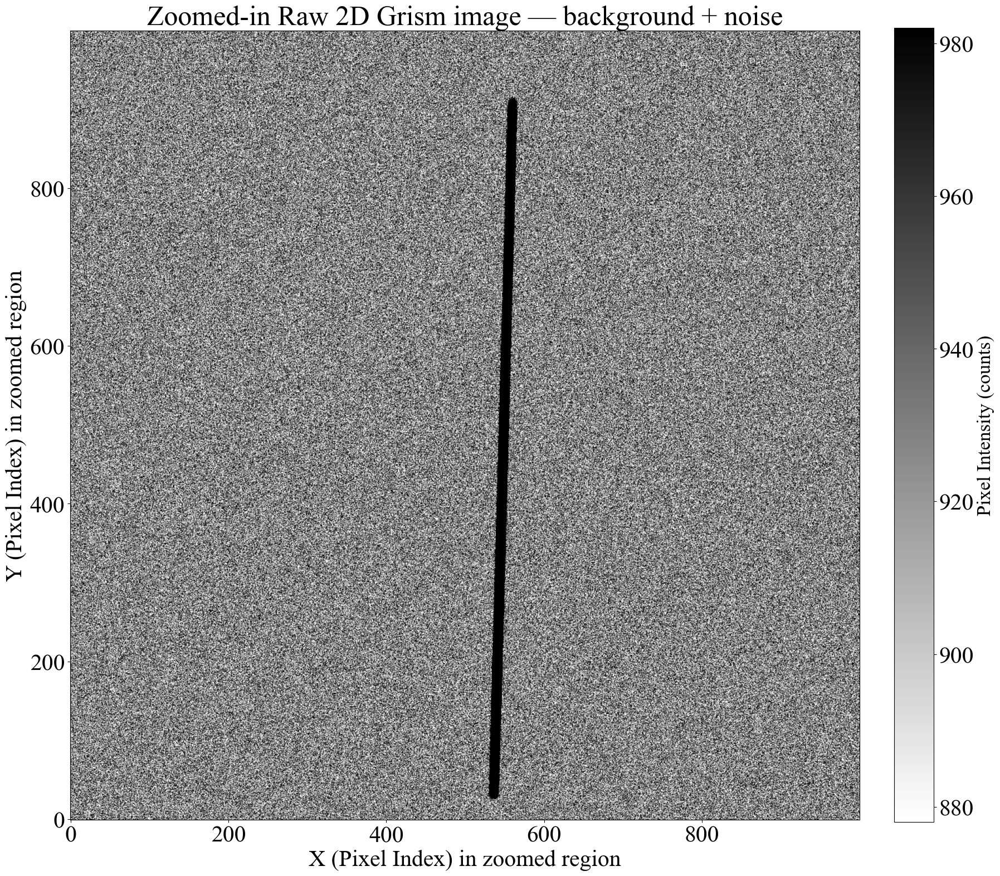

In [3]:
# Step 1: File path for the 2D grism image
# Modify as appropriate for your installation.  
# The code as written ought to work if you run the notebook in the directory where it was unpacked from our Github.
path = './'
grism_file = path + 'QSO_grism.fits'
# path = '/Users/msingha/Downloads/Grism extraction/'
# grism_file = "/Users/msingha/Downloads/Grism extraction/QSO_grism.fits"

# Step 2: Load the 2D spectrum data from the FITS file
counts_noisy_1160s = fits.getdata(grism_file)

# Step 3: Define region of interest (ROI) safely for zoom-in
x_start, x_end = 1500, 2500
y_start, y_end = 1500, 2500
x_end = min(x_end, counts_noisy_1160s.shape[1])  # keep within image bounds
y_end = min(y_end, counts_noisy_1160s.shape[0])  # keep within image bounds
zoomed_counts = counts_noisy_1160s[y_start:y_end, x_start:x_end]

# Step 4: Set global plot style
plt.rcParams.update({'font.size': 30, 'font.family': 'Times New Roman'})

# Plot 1: Linear Scale (shows strong features like emission lines)
fig1 = plt.figure(figsize=(20, 20))
plt.imshow(
    zoomed_counts,
    origin='lower',
    cmap='binary',
    vmin=np.percentile(zoomed_counts, 5),   # lower contrast bound... "default" 5
    vmax=np.percentile(zoomed_counts, 95)   # upper contrast bound... "default" 95
    # 5 to 95 shows the sky noise and the trace.
    # Changing the upper contrast bound to 99.99 or 100 will exhibit structure in the spectrum,
    # but washes out the sky noise in this simulated bright object.
)
cbar1 = plt.colorbar(fraction=0.046, pad=0.04)
cbar1.set_label("Pixel Intensity (counts)", fontsize=25)
plt.title("Zoomed-in Raw 2D Grism image — background + noise")
plt.xlabel("X (Pixel Index) in zoomed region")
plt.ylabel("Y (Pixel Index) in zoomed region")
plt.show()


##### Spectrum Setup Explanations

- Step 1: Exposure time  
  Duration of image data collection in seconds. Longer exposures collect more photons and improve signal-to-noise.  

- Step 2: Dispersion in Å/pixel  
  The change in wavelength per pixel on the detector. Here, each pixel corresponds to 10.52 Å.  

- Step 3: Conversion to μm/pixel  
  For infrared work, wavelengths are often expressed in microns.  
  Since 1 Å = 1e-4 μm, the dispersion is converted accordingly.  

- Step 4: Starting wavelength  
  The wavelength at the first pixel of the spectrum.  
 


In [4]:
# =============================
# Spectrum Setup Parameters
# =============================

# Step 1: Exposure time (s)
exposure_time = 1160  

# Step 2: Dispersion (Å/pixel)
dispersion_angstrom = 10.54  # On orbit calibration data will provide calibrated dispersion information. 
# In this tutorial, we are giving you a simple linear dispersion which is sufficient for the simulation

# Step 3: Convert dispersion to μm/pixel
dispersion_micron = dispersion_angstrom * 1e-4  

# Step 4: Starting wavelength (μm)
# On orbit calibrations, combined with positional information from direct imaging, 
#  will provide wavelength zero points for actual Roman data. 
# In this tutorial, we are providing an accurate value appropriate to the simulated data,
#  and pretending it came from such information.
wave_start = 0.995



### De-Tilting and Log-Scale Visualization

- Step 1: Load image  
  The noisy grism image is loaded from the FITS file. Each pixel stores photon counts.  

- Step 2: Rotation angle  
  The grism spectrum is tilted by 1.562°. A counterclockwise rotation corrects this.  

- Step 3: Rotate with interpolation  
  The image is rotated using cubic interpolation (`order=3`) for smoothness.  
  The `reflect` mode handles edge pixels by mirroring data.  

- Step 4: Crop back to 4088×4088  
  Rotation increases image size. The result is cropped back to the original detector dimensions.  

- Step 5: Confirm dimensions  
  Ensures the final de-tilted frame matches the expected size.  

- Step 6–7: ROI selection  
  A subregion (1500–2500 in both axes) is extracted for detailed inspection.  
  Bounds are checked against image shape to avoid indexing errors.  

- Step 8: Plot style  
  Global font settings are applied for clarity in publication-style figures.  

- Step 9: Log-scale plotting  
  Logarithmic scaling (`LogNorm`) makes faint background structures visible alongside bright emission features.  
  The lower bound excludes zeros to avoid log artifacts.  

- Step 10–12: Annotations  
  A colorbar shows counts per pixel. Title and axis labels describe the plotted region.  


Grism image dimensions after de-tilting: 4088 x 4088


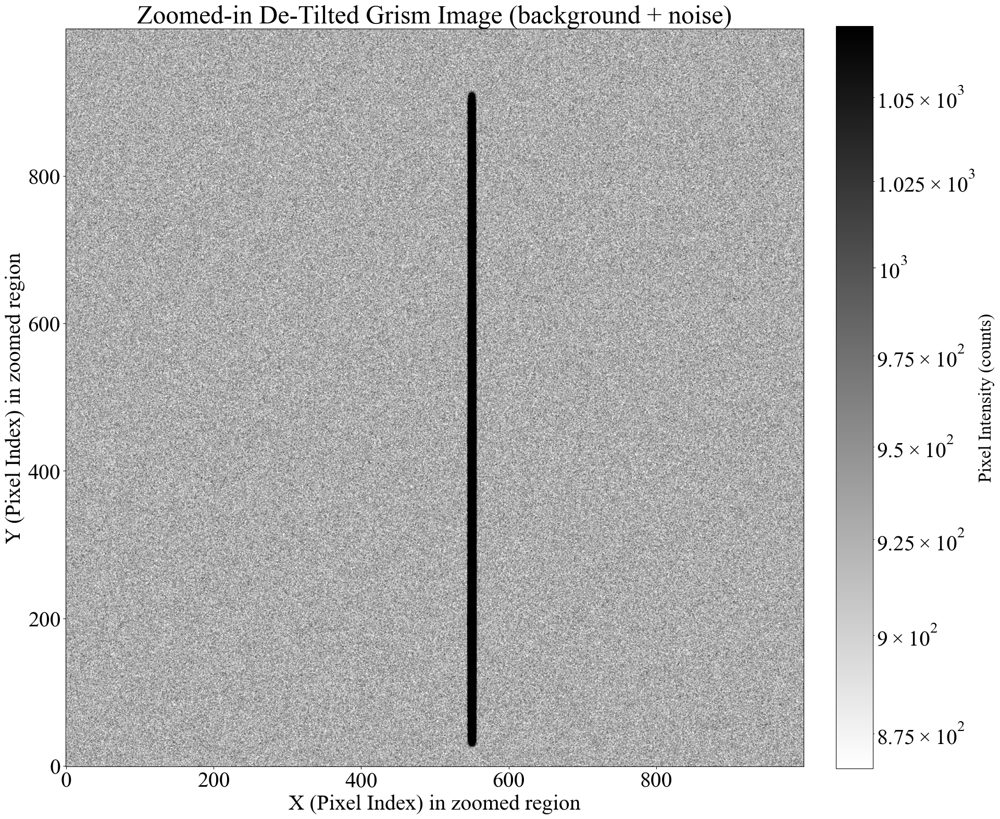

In [5]:
# =============================
# Grism Image Rectification (De-Tilting) and Log-Scale Plot
# =============================

# Step 1: Load the 2D grism image (with noise and background)
counts_noisy_1160s = fits.getdata(grism_file)

# Step 2: Define the rotation angle (degrees counterclockwise)
rotation_angle = -1.562  # On orbit data with come up with calibrated maesauyement of tilt angle. 
#In this tutorial, we are giving you a simple linear dispersion wgich is sufficient for the simulation


# Step 3: Rotate image with cubic interpolation, reflecting at edges
rotated_data = rotate(
    counts_noisy_1160s,
    rotation_angle,
    reshape=True,
    order=3,
    mode='reflect'
)

# Step 4: Crop rotated image back to original 4088×4088 pixels
crop_start = (rotated_data.shape[0] - 4088) // 2
crop_end = crop_start + 4088
big_data = rotated_data[crop_start:crop_end, crop_start:crop_end]

# Step 5: Confirm the shape
grism_file_shape_y, grism_file_shape_x = big_data.shape
print(f"Grism image dimensions after de-tilting: {grism_file_shape_y} x {grism_file_shape_x}")

# Step 6: Define Region of Interest (ROI) bounds
x_start, x_end = 1500, 2500
y_start, y_end = 1500, 2500
x_end = min(x_end, big_data.shape[1])
y_end = min(y_end, big_data.shape[0])

# Step 7: Extract zoomed-in ROI
zoomed_big_data = big_data[y_start:y_end, x_start:x_end]

# Step 8: Set up figure style
fig = plt.figure(figsize=(20, 20))
plt.rcParams.update({'font.size': 30, 'font.family': 'Times New Roman'})

# Step 9: Plot ROI in log scale (reveals faint structures + noise)
plt.imshow(
    zoomed_big_data,
    origin='lower',
    cmap='binary',
    norm=LogNorm(
        vmin=np.percentile(zoomed_big_data[zoomed_big_data > 0], 1),  # avoid zeros
        vmax=np.percentile(zoomed_big_data, 99)
    )
)

# Step 10: Add colorbar
cbar = plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_label("Pixel Intensity (counts)", fontsize=25)

# Step 11: Title and axis labels
plt.title("Zoomed-in De-Tilted Grism Image (background + noise)")
plt.xlabel("X (Pixel Index) in zoomed region")
plt.ylabel("Y (Pixel Index) in zoomed region")

# Step 12: Show the plot
plt.show()


## Symmetric Sky Background: Geometry-Driven Signal & Sky Boxes

This procedure defines **sky regions** from the **signal geometry** itself: two rectangles of the **same dispersion length** as the object, placed **symmetrically** to the left and right in the cross-dispersion direction, with a small **gap** to avoid PSF wings. This mirrors the logic of annular sky in aperture photometry but for a dispersed spectrum.

---

### Parameters

- `gap_px`: small separation (pixels) between the signal box and each sky box (cross-dispersion).  
  Keeps PSF wings out of the sky estimate.
- `sky_width_px`: width (pixels) of each sky box (cross-dispersion).  
  Wider boxes reduce sky noise but risk including contaminants.

---

### Signal box (source of truth)

- Signal (object) rectangle is defined once from known trace bounds:
  - Left edge (cross-dispersion): `sig_x0`
  - Bottom edge (dispersion start): `sig_y0`
  - Width (cross-dispersion): `sig_w`
  - Top edge (exclusive): `sig_y1`
  - Height (dispersion length): `sig_h = sig_y1 - sig_y0`
- All derived sky geometry is anchored to these values, ensuring **matching dispersion length**.

---

### Sky boxes (absolute image coordinates)

**Left sky** (immediately left of signal, separated by `gap_px`):
- Inner edge (closest to signal): $\mathrm{left\_x1} = \max(0,\ \mathrm{sig\_x0} - \mathrm{gap\_px})$
- Outer edge: $\mathrm{left\_x0} = \max(0,\ \mathrm{left\_x1} - \mathrm{sky\_width\_px})$
- Width: $\mathrm{left\_w} = \mathrm{left\_x1} - \mathrm{left\_x0}$
- Vertical span: $[\mathrm{sig\_y0},\, \mathrm{sig\_y0} + \mathrm{sig\_h})$

**Right sky** (immediately right of signal, separated by `gap_px`):
- Inner edge (closest to signal): $\mathrm{right\_x0} = \min(W,\ \mathrm{sig\_x0} + \mathrm{sig\_w} + \mathrm{gap\_px})$
- Outer edge: $\mathrm{right\_x1} = \min(W,\ \mathrm{right\_x0} + \mathrm{sky\_width\_px})$
- Width: $\mathrm{right\_w} = \mathrm{right\_x1} - \mathrm{right\_x0}$
- Vertical span: $[\mathrm{sig\_y0},\, \mathrm{sig\_y0} + \mathrm{sig\_h})$

Bounds are **clamped** to the image size $(H, W)$ so rectangles near edges don’t fall outside the array.

**Validation:** If any sky box collapses (non-positive width/height), raise an error and adjust `gap_px` or `sky_width_px`.

---

### Chunk extraction

- `signal_chunk = big_data[sig_y0:sig_y0+sig_h, sig_x0:sig_x0+sig_w]`
- `left_sky    = big_data[left_y0:left_y0+left_h, left_x0:left_x0+left_w]`
- `right_sky   = big_data[right_y0:right_y0+right_h, right_x0:right_x0+right_w]`

All three chunks share the **same dispersion length**, ensuring the sky is sampled over the same rows as the signal.

---

### Robust background estimate

- Concatenate both sky chunks to form a single sky sample.  
- Apply a **gentle percentile clip** (e.g., 10–90%) to remove outliers (cosmic rays, hot pixels, faint sources).  
- Use the **median** of the clipped distribution as the background level (in counts).

This yields a **local, symmetric, robust** estimator of the sky appropriate for an isolated object.

---

### Visualization overlay (sanity check)

- Display a zoomed cutout of the image with:
  - Signal rectangle in **red**,
  - Left/right sky rectangles in **lime**,
  - Log scaling for dynamic range.
- Rectangles are converted from absolute coordinates to the zoom’s local coordinates for plotting.  
- A legend clarifies which boxes are signal vs. sky.

---

### Rationale & tuning

- **Symmetry** cancels large-scale gradients to first order (left/right averaged sky).  
- **Gap** protects the sky estimate from PSF wings and extraction leakage.  
- **Width** trades off variance (wider = lower noise) vs. contamination risk (wider = more chance to catch other traces or defects).  
- If background varies along the dispersion direction, consider computing a **row-wise** sky (median per row from the two sky strips) and fitting a low-order polynomial in $y$.

---

### Failure modes to watch

- Sky boxes overlapping other spectra or defects → tighten percentile clip or narrow `sky_width_px`.  
- Very crowded fields → use a 2D background model (e.g., spline over $y$) instead of constant median.  
- Edges of detector → reduce `gap_px`/`sky_width_px` or move the signal box if possible.



Estimated median background (counts): 927.8269


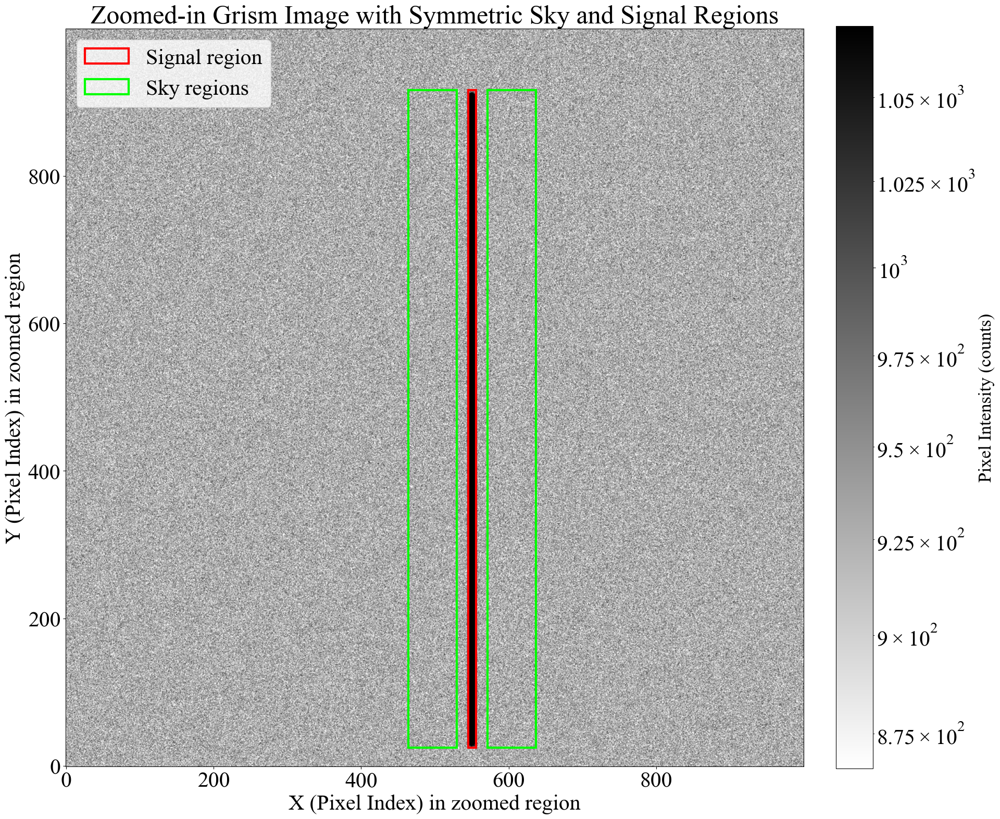

In [6]:
# =============================
# Geometry-driven Signal & Sky Regions (symmetric sky boxes)
# =============================

# --- PARAMETERS (tune as needed) ---
gap_px       = 15     # small gap between object and sky regions (pixels, cross-dispersion)
sky_width_px = 66    # width of each sky rectangle (pixels, cross-dispersion)

# --- SIGNAL RECTANGLE (absolute image coords) ---
# Use your known spectral window; keep these as the single source of truth.
sig_x0 = 2045                # left edge (cross-dispersion)
sig_y0 = 1525                # bottom edge (dispersion start)
sig_w  = 11                  # width  (cross-dispersion)
sig_y1 = 2416 
sig_h  = sig_y1 - sig_y0     # length along dispersion

# --- IMAGE SHAPE ---
H, W = big_data.shape

# --- SKY RECTANGLES (absolute image coords) ---
# Left sky: immediately to the left of the signal, separated by gap_px
left_x1  = max(0, sig_x0 - gap_px)                           # inner edge (nearest to signal)
left_x0  = max(0, left_x1 - sky_width_px)                    # outer edge
left_w   = left_x1 - left_x0                                  # actual width after clamping
left_y0  = sig_y0
left_h   = sig_h

# Right sky: immediately to the right of the signal, separated by gap_px
right_x0 = min(W, sig_x0 + sig_w + gap_px)                   # inner edge (nearest to signal)
right_x1 = min(W, right_x0 + sky_width_px)                   # outer edge
right_w  = right_x1 - right_x0
right_y0 = sig_y0
right_h  = sig_h

# Validate non-empty sky boxes; if too close to image edge, shrink widths accordingly
if left_w <= 0 or right_w <= 0 or left_h <= 0 or right_h <= 0:
    raise ValueError("Sky boxes collapsed—adjust gap_px/sky_width_px or verify signal box is inside the image.")

# --- EXTRACT CHUNKS ---
signal_chunk = big_data[sig_y0:sig_y0+sig_h, sig_x0:sig_x0+sig_w]             # (sig_h, sig_w)
left_sky     = big_data[left_y0:left_y0+left_h, left_x0:left_x0+left_w]       # (sig_h, left_w)
right_sky    = big_data[right_y0:right_y0+right_h, right_x0:right_x0+right_w] # (sig_h, right_w)

# --- ROBUST BACKGROUND ESTIMATE FROM SYMMETRIC SKY ---
# You can drop overly bright pixels (e.g., cosmic rays) with a simple percentile clip if desired.
both_sky = np.concatenate([left_sky.ravel(), right_sky.ravel()])
low, high = np.percentile(both_sky, [10, 90])  # gentle clip; adjust if needed
sky_mask = (both_sky >= low) & (both_sky <= high)
median_background = float(np.nanmedian(both_sky[sky_mask])) if np.any(sky_mask) else float(np.nanmedian(both_sky))
print(f"Estimated median background (counts): {median_background:.4f}")


# =============================
# Overlay Visualization on Zoom (with symmetric rectangles)
# =============================
x_start, x_end = 1500, 2500
y_start, y_end = 1500, 2500
x_end = min(x_end, W)
y_end = min(y_end, H)

zoom = big_data[y_start:y_end, x_start:x_end]

fig, ax = plt.subplots(figsize=(20, 20))
plt.rcParams.update({'font.size': 30, 'font.family': 'Times New Roman'})

img = ax.imshow(
    zoom,
    origin='lower',
    cmap='binary',
    norm=LogNorm(
        vmin=max(1, np.percentile(zoom[zoom > 0], 1)),
        vmax=np.percentile(zoom, 99)
    )
)

cbar = plt.colorbar(img, ax=ax, fraction=0.046, pad=0.04)
cbar.set_label("Pixel Intensity (counts)", fontsize=25)

# Helper to add a rectangle given absolute coords
def add_rect(ax, abs_x0, abs_y0, width, height, **kw):
    # Transform absolute coords to the zoomed frame
    x0 = abs_x0 - x_start
    y0 = abs_y0 - y_start
    # Only draw if overlapping the zoom
    if (x0 + width > 0) and (x0 < (x_end - x_start)) and (y0 + height > 0) and (y0 < (y_end - y_start)):
        ax.add_patch(Rectangle((x0, y0), width, height, fill=False, **kw))

# Signal in red
add_rect(ax, sig_x0, sig_y0, sig_w, sig_h, linewidth=3, edgecolor='r', label='Signal region')

# Left/Right sky in lime
add_rect(ax, left_x0,  left_y0,  left_w,  left_h,  linewidth=3, edgecolor='lime', label='Sky regions')
add_rect(ax, right_x0, right_y0, right_w, right_h, linewidth=3, edgecolor='lime')

# Build legend with deduplicated handles
handles, labels = ax.get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax.legend(by_label.values(), by_label.keys(), loc='upper left', frameon=True)

ax.set_title("Zoomed-in Grism Image with Symmetric Sky and Signal Regions")
ax.set_xlabel("X (Pixel Index) in zoomed region")
ax.set_ylabel("Y (Pixel Index) in zoomed region")
plt.show()



## Background Subtraction, Cropping, and Sanity-Check Visualization

This block removes a **constant sky level**, isolates the **signal window** for extraction, and shows a **zoomed view** of the background-subtracted image to verify the subtraction.

---

### 1) Subtract a constant background

We subtract the robust sky estimate (median from symmetric sky boxes):

$\mathrm{background\_subtracted} = \mathrm{big\_data} - \mathrm{median\_background}$

- Interprets the sky as **spatially uniform** over the local region.
- Appropriate when gradients are weak across the object’s footprint.
- If a gradient is present, prefer a **row-wise** sky or a low-order 2D model.

---

### 2) Crop the signal window for extraction

Use the same signal geometry to produce the 2D cutout used downstream:

$\mathrm{data} = \mathrm{background\_subtracted}[\,\mathrm{sig\_y0}:\mathrm{sig\_y0}+\mathrm{sig\_h},\ \mathrm{sig\_x0}:\mathrm{sig\_x0}+\mathrm{sig\_w}\,]$

- Ensures that the extraction (summation or optimal) operates on the **exact** spectral trace region.
- Report the shape $(n_y, n_x)$ for quick verification:
  - $n_y$: number of dispersion rows (wavelength bins)
  - $n_x$: cross-dispersion width (aperture width)

---

### 3) Visual sanity check (zoomed panel)

Display a zoomed view of the **background-subtracted** image:

- `LogNorm` highlights faint residuals and structure after subtraction.
- Colorbar is labeled in **counts** (post-subtraction).
- This plot should show:
  - The spectrum standing out against a flatter background,
  - Minimal large-scale offset after subtraction,
  - No obvious over-subtraction (e.g., widespread negative backgrounds).

---

### Practical notes

- **Clipping for visualization:** $\mathrm{vmin}>0$ is required for logarithmic scaling; negative pixels are clipped only for plotting, not for analysis.
- **Residual checks:** If you see structured residuals near the trace, reduce sky contamination (adjust gap/width, stronger clipping) or switch to a **row-wise median** per dispersion row.
- **Reproducibility:** Keep the **signal window** the single source of truth; all sky geometry should reference its bounds (same dispersion length).




Cropped trace shape: ny=891, nx=11


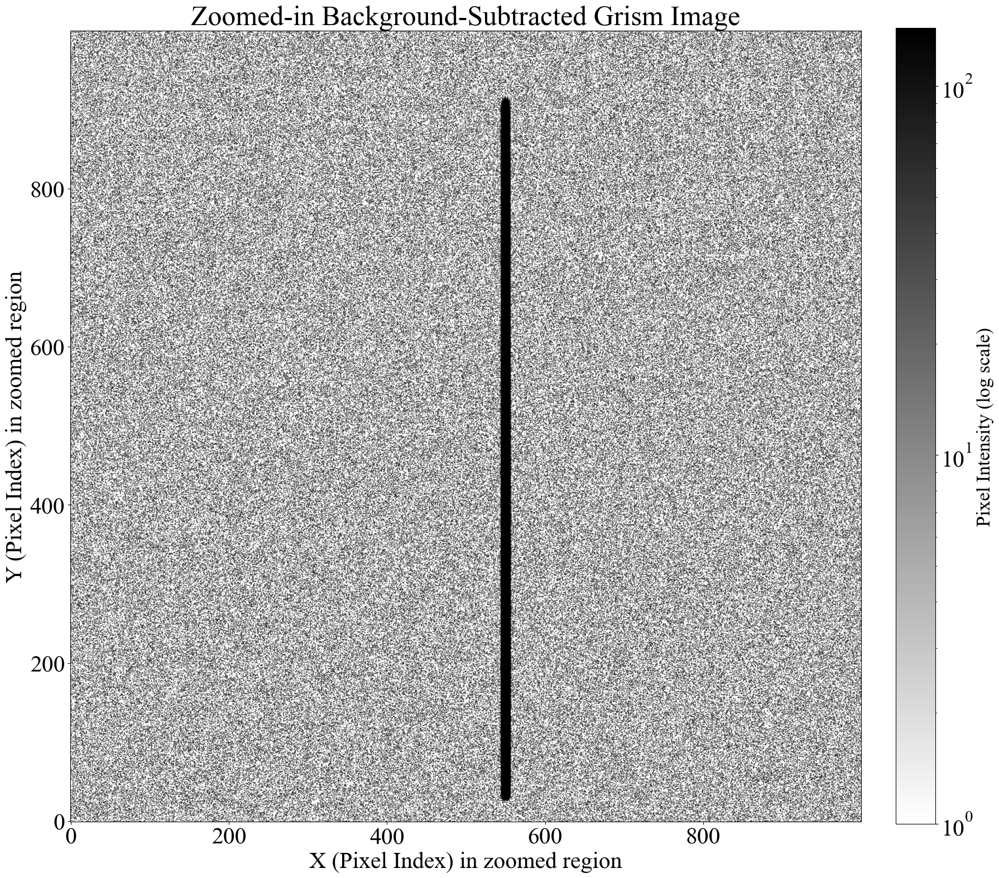

In [7]:
# --- SUBTRACT BACKGROUND (constant model) ---
background_subtracted_big_data = big_data - median_background

# --- CROP THE DATA FOR EXTRACTION (same as your signal window) ---
data = background_subtracted_big_data[sig_y0:sig_y0+sig_h, sig_x0:sig_x0+sig_w]
ny, nx = data.shape
print(f"Cropped trace shape: ny={ny}, nx={nx}")


# =============================
# Optional: Show background-subtracted zoom
# =============================
zoom_bs = background_subtracted_big_data[y_start:y_end, x_start:x_end]
plt.figure(figsize=(20, 20))
plt.imshow(
    zoom_bs,
    origin='lower',
    cmap='binary',
    norm=LogNorm(vmin=1, vmax=np.percentile(np.clip(zoom_bs, 0, None), 99))
)
plt.colorbar(fraction=0.046, pad=0.04).set_label("Pixel Intensity (log scale)", fontsize=25)
plt.title("Zoomed-in Background-Subtracted Grism Image")
plt.xlabel("X (Pixel Index) in zoomed region")
plt.ylabel("Y (Pixel Index) in zoomed region")
plt.show()


## Extracting a 1D Spectrum (Simple Summation)

**Step 1: Dimensions of the cropped region**  
The 2D trace `data` has shape `(ny, nx)`:
- **y-axis (ny):** dispersion direction → each row corresponds to a wavelength bin.  
- **x-axis (nx):** spatial direction → shows how light spreads perpendicular to dispersion (the PSF or slit).  

So if `data.shape = (40, 20)`, that means 40 dispersion bins and 20 spatial bins.

---

**Step 2: Collapsing along the spatial axis**  
To build a 1D spectrum, we want flux as a function of wavelength.  
At each wavelength row, flux is spread out spatially across detector columns.  
We collect all that flux by summing along the spatial axis:

$F_{\text{1D}}(y) = \sum_{x=1}^{nx} \, \text{data}(y, x)$

This produces a 1D array `spectrum_1d` of length `ny`.

---

**Why this works:**  
- Each row = photons from a single wavelength bin.  
- Summing across the row gathers all photons into one number = the total flux at that wavelength.  
- This method is called **boxcar (or aperture) summation**.  

---

**Note:**  
- This is the simplest extraction method.  
- It gives equal weight to every pixel in the spatial direction.  
- More advanced approaches (e.g. *optimal extraction*, Horne 1986) weight pixels by their profile and noise, improving signal-to-noise.  

In [8]:
# =============================
# Extract 1D Spectrum from 2D Trace
# =============================

# Step 1: Dimensions of cropped spectral region
ny, nx = data.shape  # "data" is the 2D cropped trace (y: dispersion, x: spatial)

# Step 2: Collapse along spatial direction
# Sum along detector columns to combine flux into a single spectrum
spectrum_1d = np.sum(data, axis=1)

### 1D Spectrum Extraction (wavelength calibration and plotting)


- Step 3: Wavelength mapping  
  Pixel index is converted to wavelength using:  
  $\lambda = \mathrm{wave\_start} + i \times \mathrm{dispersion\_micron}$ 
  where $i$ is the row index along the dispersion axis.  

- Step 4: Plot styling  
  A consistent `ggplot` style and enlarged fonts are applied for clarity.  

- Step 5: Spectrum plot  
  The extracted 1D spectrum is shown as flux density (counts) vs wavelength (µm).  
  The x-axis is restricted to 1.0–1.93 µm, the grism’s effective coverage.  


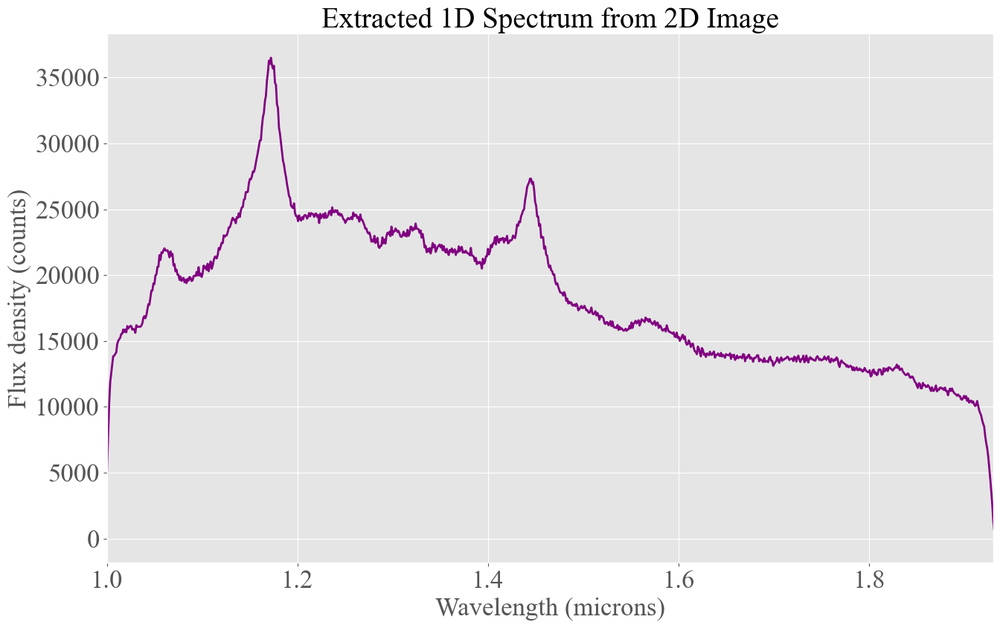

In [9]:


# Build wavelength grid
# Use starting wavelength + dispersion per pixel to map pixel index → wavelength
rough_wave = np.arange(ny) * dispersion_micron + wave_start

# Step 4: Set global plot style
plt.style.use('ggplot')
plt.rcParams.update({
    'font.size': 25,           # Default text size
    'axes.titlesize': 28,      # Plot title size
    'axes.labelsize': 26,      # Axis label size
    'xtick.labelsize': 25,     # X tick size
    'ytick.labelsize': 25,     # Y tick size
    'legend.fontsize': 25,     # Legend font
    'figure.titlesize': 28     # Figure title
})

# Step 5: Plot spectrum
plt.figure(figsize=(14, 9))
plt.plot(rough_wave, spectrum_1d, linewidth=2, color='purple')
plt.xlabel("Wavelength (microns)", fontsize=25)
plt.ylabel("Flux density (counts)", fontsize=25)
plt.title("Extracted 1D Spectrum from 2D Image", fontsize=28)
plt.grid(True)
plt.xlim(1, 1.93)  # Limit to expected grism coverage
plt.tight_layout()
plt.show()


### 1D Spectrum and Grism Response

- Step 1: Dimensions  
  The cropped spectral cutout (`data`) has shape (ny, nx).  
  - ny = number of rows = dispersion/wavelength direction  
  - nx = number of columns = spatial direction  

- Step 2: Collapse to 1D  
  Summing along the spatial axis (`axis=1`) integrates flux to yield a 1D spectrum.  

- Step 3: Wavelength grid  
  Wavelengths are mapped using  
  $\lambda = \mathrm{wave\_start} + i \times \mathrm{dispersion\_micron}$  
  where \( i \) is the pixel index along ny.  

- Step 4–5: Grism response  
  The Roman grism response file is loaded and split into:  
  - `w0`: wavelength (µm)  
  - `tr0`: throughput/transmission (0–1)  

- Step 6: Interpolation  
  The response curve is interpolated at the same wavelengths as the extracted spectrum (`rough_wave`).  

- Step 7: Original response plot  
  Shows the full throughput curve of the Roman grism.  

- Step 8: Interpolated response plot  
  Overlays the response function onto the sampled spectrum wavelengths, ensuring instrument sensitivity is matched to data.  


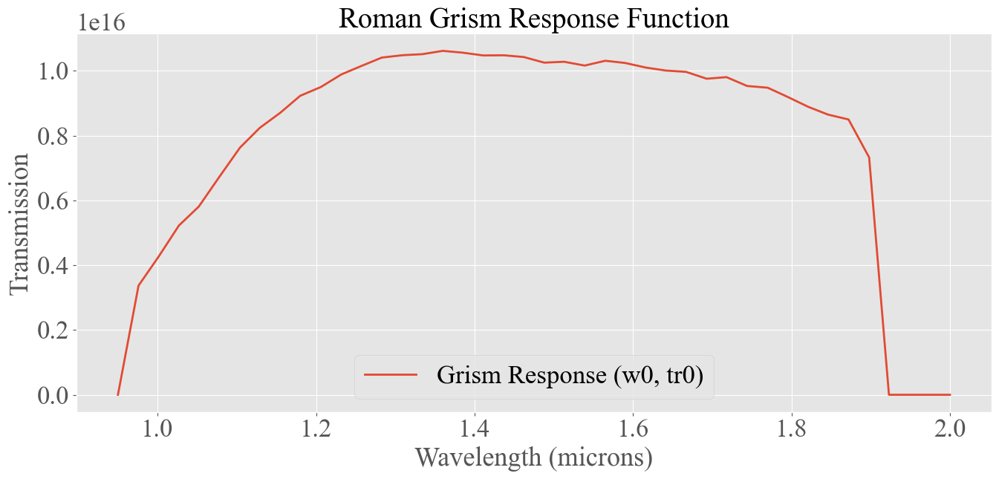

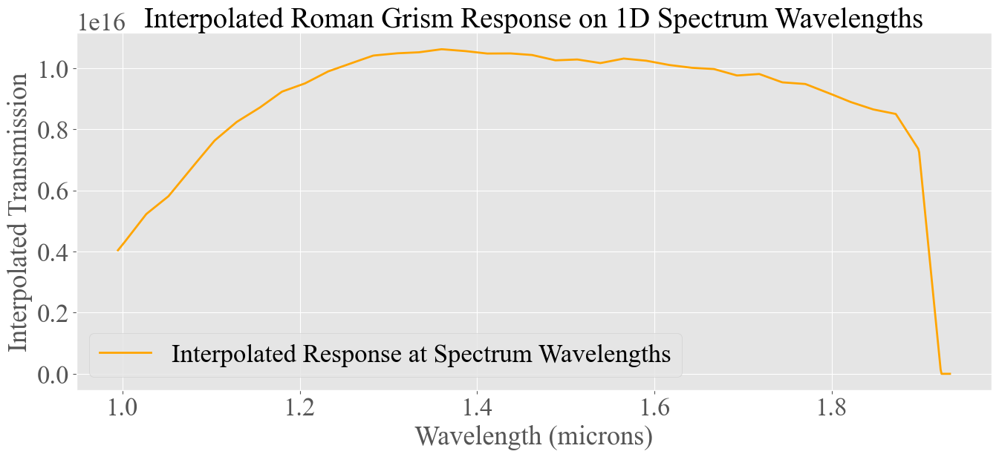

In [10]:

# Step 4: Load grism response function (Roman)
response_data = np.loadtxt(path + 'grism_response_function.txt')

# Step 5: Separate wavelength and throughput columns
w0 = response_data[:, 0]  # wavelength (microns)
tr0 = response_data[:, 1]  # transmission (0–1)

# Step 6: Interpolate response at extracted spectrum wavelengths
y1 = np.interp(rough_wave, w0, tr0)

# Step 7: Plot original grism response function
plt.style.use('ggplot')
plt.rcParams.update({
    'font.size': 25,
    'axes.titlesize': 28,
    'axes.labelsize': 26,
    'xtick.labelsize': 25,
    'ytick.labelsize': 25,
    'legend.fontsize': 25,
    'figure.titlesize': 28
})

plt.figure(figsize=(14, 7))
plt.plot(w0, tr0, label="Grism Response (w0, tr0)", linewidth=2)
plt.xlabel("Wavelength (microns)")
plt.ylabel("Transmission")
plt.title("Roman Grism Response Function")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Step 8: Plot interpolated response at spectrum wavelengths
plt.figure(figsize=(14, 7))
plt.plot(rough_wave, y1, label="Interpolated Response at Spectrum Wavelengths", color='orange', linewidth=2)
plt.xlabel("Wavelength (microns)")
plt.ylabel("Interpolated Transmission")
plt.title("Interpolated Roman Grism Response on 1D Spectrum Wavelengths")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


### Input QSO Spectrum

- Step 1: Load spectrum  
  The input SED (Spectral Energy Distribution) is read from the HDF5 file (`QSO_sed_input.hdf5`).  
  The dataset `SED/1` has shape (9300, 2), where column 0 is wavelength and column 1 is flux density.  

- Step 2: Extract arrays  
  - `wavelength`: microns  
  - `flux`: flux density in units of \(10^{-17}\) erg/s/cm²/Å  

- Step 3: Style settings  
  A consistent `ggplot` style and large fonts are applied for clarity.  

- Step 4: Plot  
  - X-axis: wavelength (1–1.93 μm, matching the Roman grism coverage).  
  - Y-axis: flux density, capped at 50 (to emphasize main features).  
  - Title and legend clearly label the dataset.  

This plot provides a sanity check: what goes into the simulator (input QSO SED) should be consistent with what comes out after grism simulation.  


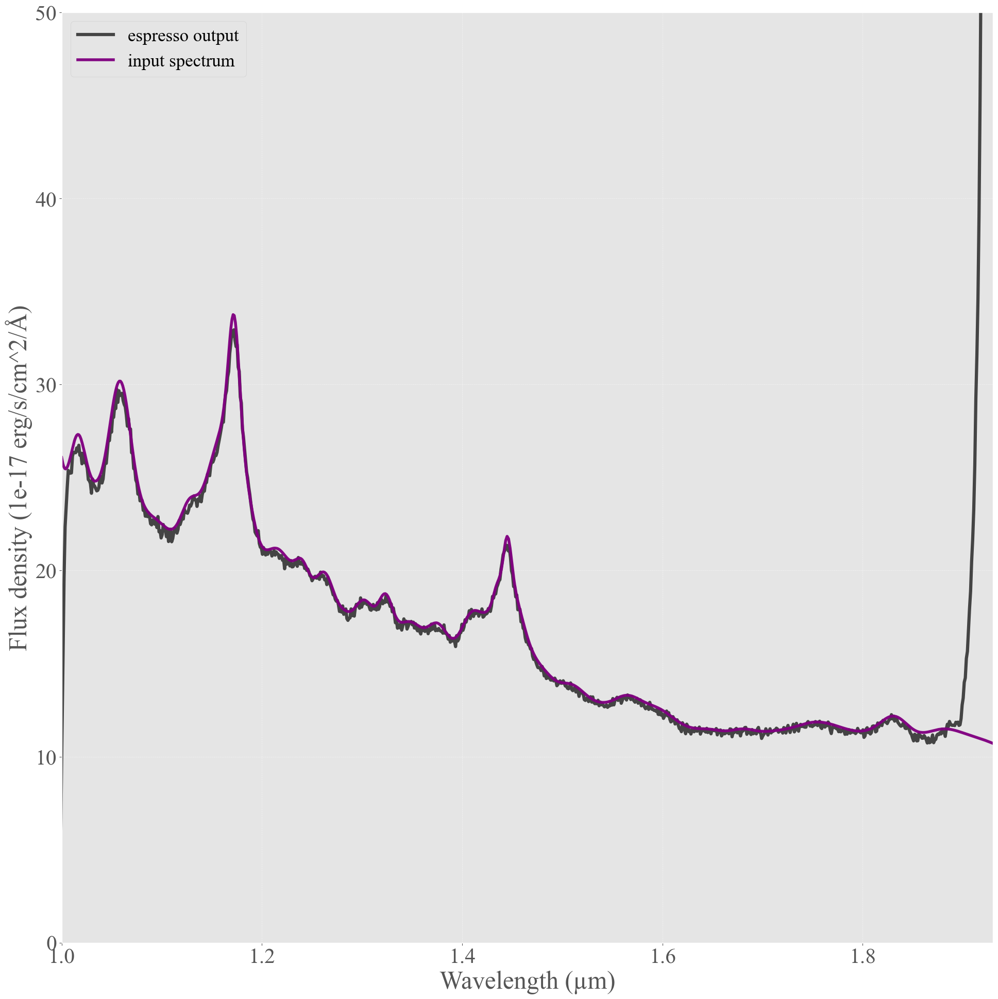

In [11]:
# =============================
# Input vs output Spectrum Visualization
# =============================

# Step 1: Load input spectrum from HDF5
# --- Load input spectrum for comparison ---
with h5py.File(path + 'QSO_sed_input.hdf5', 'r') as f:
    sed = f['SED/1'][:]  # (N,2)
wavelength = sed[:, 0]  # microns
flux = sed[:, 1]        # 1e-17 erg/s/cm^2/Å


plt.style.use('ggplot')

# Step 2: Global fonts
plt.rcParams.update({'font.size': 30, 'font.family': 'Times New Roman'})

# Step 3: Figure
fig = plt.figure(figsize=(20, 20))

# Step 4: Guard against division by zero/small response
# (avoid spikes where instrument throughput is ~0)
y1_safe = np.clip(y1, 1e-6, None)

# Step 5: Plot response-corrected extracted spectrum
# Scale: counts → (erg/s/cm^2/Å) using exposure_time and dispersion per Å,
# then multiply by 1e17 to match the y-axis label unit.
plt.plot(
    rough_wave,
    spectrum_1d / y1_safe * 1e17 / dispersion_angstrom / exposure_time,
    linestyle='-',
    color='k',
    label='espresso output',
    lw=4.5,
    alpha=0.7
)

# Step 6: Plot input spectrum (truth)
plt.plot(
    wavelength,
    flux,
    linewidth=4,
    label='input spectrum',
    color='purple',
    alpha=0.96
)

# Step 7: Labels, legend, limits, grid
plt.xlabel('Wavelength (µm)', fontsize=35)
plt.ylabel('Flux density (1e-17 erg/s/cm^2/Å)', fontsize=35)
plt.legend(fontsize=25, loc='upper left')
plt.xlim(1, 1.93)
plt.ylim(0,50)
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='white', alpha=0.6)

# Step 8: Layout, ticks, save, show
plt.tight_layout()
plt.tick_params(axis='x', labelsize=30)
plt.tick_params(axis='y', labelsize=30)
#plt.savefig('/Users/msingha/Downloads/input_v_output_ggplot_style.pdf', dpi=300)
plt.show()
